<b>Case study review-1</b><br>
Aakash P - CB.SC.I5DAS21001 <br>
Arjun Adityan J - CB.SC.I5DAS21015 <br>
Jagadeesh M - CB.SC.I5DAS21030 <br>
Kabeleswar PE - CB.SC.I5DAS21032 <br>
Sarveshwaran AM - CB.SC.I5DAS21055 

# Analysis of the trends of landslides over time

<b> Description of Attribute </b>
1. <b>source_name:</b> The source of the information (which media has published).
2. <b>event_date:</b> The date and time when the event occurred.
3. <b>event_title:</b> Name of the event.
4. <b>location_accuracy:</b> The accuracy of the location (e.g.:exact, 1km, 5km ,.....).
5. <b>landslide_category:</b> Category of the landslide (e.g., landslide, mudslide, rockfall).
6. <b>landslide_trigger:</b> The triggering factor of the landslide (e.g., rainfall, earthquake, human activity).
7. <b>landslide_size:</b> Size of the landslide (e.g., small, medium, large).
8. <b>landslide_setting:</b> Type of the location where the landslide occurred (e.g., above road, below road, on slope).
9. <b>fatality_count:</b> Number of lives lost resulting from the incident.
10. <b>injury_count:</b> Number of injuries resulting from the incident.
11. <b>storm_name:</b> Name of the storm associated with the event (if applicable).
12. <b>latitude:</b> Latitude coordinates of the event location.
13. <b>longitude:</b> Longitude coordinates of the event location.
14. <b>country_name:</b> Name of the country where the event occurred.
15. <b>country_code:</b> Code of the respective country.
16. <b>admin_division_name:</b> Administrative division where the event occurred (e.g., state, province).
17. <b>gazetteer_closest_point:</b> Closest named location or landmark.
18. <b>gazetteer_distance:</b> Distance to the closest named location or landmark.

<b>Problem Statement :</b>
1. Analyzing the temporal distribution of landslide events over time to identify seasonal patterns or trends.
2. Investigating the spatial distribution of landslide events across different regions. 
3. Examining the relationships between landslide characteristics (such as size and trigger) and their impacts (fatality and injury counts).
4. Identifying potential factors or triggers contributing to landslide occurrences.
5. Providing recommendations or insights to enhance landslide monitoring.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv(r'nasa_global_landslide_catalog_point.csv')
df.head()

,OID,source_name,source_link,event_id,event_date,event_time,event_title,event_description,location_description,location_accuracy,...,event_import_id,latitude,longitude,country_name,country_code,admin_division_name,gazetteer_closest_point,gazetteer_distance,submitted_date,last_edited_date
0,-1,Oregon DOT,NaN,8113,12/8/2015 14:39:00,15:00,"US 30, milepost 95",NaN,"US 30, milepost 95",exact,...,NaN,46.1947,-123.7669,United States,US,Oregon,Astoria,4.33,6/30/2016 19:46:44,NaN
1,-1,Oregon DOT,NaN,8775,5/27/2011 13:45:00,14:00,"OR 501, milepost 6",NaN,"OR 501, milepost 6",exact,...,8775,44.3104,-123.6315,United States,US,Oregon,Tidewater,23.17,7/8/2016 16:46:11,NaN
2,-1,Oregon DOT,NaN,8859,1/6/2011 13:21:00,13:00,"OR 42, milepost 44",NaN,"OR 42, milepost 44",exact,...,8859,42.9627,-123.8388,United States,US,Oregon,Remote,7.30,7/8/2016 18:19:33,NaN
3,-1,Oregon DOT,NaN,8370,2/18/2014 16:50:00,17:00,"OR 281, milepost 5",NaN,"OR 281, milepost 5",exact,...,8370,45.6542,-121.5491,United States,US,Oregon,Hood River,2.33,7/6/2016 15:03:48,NaN
4,-1,Oregon DOT,NaN,7953,3/25/2016 0:18:00,00:00,"OR 180, milepost 13.5",NaN,"OR 180, milepost 13.5",exact,...,7953,44.6452,-123.5804,United States,US,Oregon,Eddyville,14.63,6/30/2016 14:42:22,NaN


## Data cleaning

In [3]:
df.columns

Index(['OID', 'source_name', 'source_link', 'event_id', 'event_date',
       'event_time', 'event_title', 'event_description',
       'location_description', 'location_accuracy', 'landslide_category',
       'landslide_trigger', 'landslide_size', 'landslide_setting',
       'fatality_count', 'injury_count', 'storm_name', 'photo_link',
       'comments', 'event_import_source', 'event_import_id', 'latitude',
       'longitude', 'country_name', 'country_code', 'admin_division_name',
       'gazetteer_closest_point', 'gazetteer_distance', 'submitted_date',
       'last_edited_date'],
      dtype='object')

In [4]:
df.drop(['OID','event_id','source_link','event_description','location_description','photo_link','comments',
         'event_import_id','event_import_source','submitted_date','last_edited_date'],axis=1,inplace=True)

In [5]:
df.columns

Index(['source_name', 'event_date', 'event_time', 'event_title',
       'location_accuracy', 'landslide_category', 'landslide_trigger',
       'landslide_size', 'landslide_setting', 'fatality_count', 'injury_count',
       'storm_name', 'latitude', 'longitude', 'country_name', 'country_code',
       'admin_division_name', 'gazetteer_closest_point', 'gazetteer_distance'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14703 entries, 0 to 14702
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   source_name              14703 non-null  object 
 1   event_date               13067 non-null  object 
 2   event_time               6540 non-null   object 
 3   event_title              14011 non-null  object 
 4   location_accuracy        14673 non-null  object 
 5   landslide_category       14701 non-null  object 
 6   landslide_trigger        14701 non-null  object 
 7   landslide_size           14699 non-null  object 
 8   landslide_setting        14697 non-null  object 
 9   fatality_count           10873 non-null  float64
 10  injury_count             6357 non-null   float64
 11  storm_name               654 non-null    object 
 12  latitude                 14698 non-null  float64
 13  longitude                14698 non-null  float64
 14  country_name          

In [7]:
df.drop('event_time',axis=1,inplace=True)
df.dropna(subset=['event_date'],inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13067 entries, 0 to 14699
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   source_name              13067 non-null  object 
 1   event_date               13067 non-null  object 
 2   event_title              12539 non-null  object 
 3   location_accuracy        13037 non-null  object 
 4   landslide_category       13065 non-null  object 
 5   landslide_trigger        13065 non-null  object 
 6   landslide_size           13064 non-null  object 
 7   landslide_setting        13062 non-null  object 
 8   fatality_count           10710 non-null  float64
 9   injury_count             6194 non-null   float64
 10  storm_name               654 non-null    object 
 11  latitude                 13065 non-null  float64
 12  longitude                13065 non-null  float64
 13  country_name             13019 non-null  object 
 14  country_code             13

In [8]:
df['event_title'].fillna('Unknown',inplace=True)
df['storm_name'].fillna('Other reason',inplace=True)
df.dropna(subset=['location_accuracy','latitude','country_name'],inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12989 entries, 0 to 14698
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   source_name              12989 non-null  object 
 1   event_date               12989 non-null  object 
 2   event_title              12989 non-null  object 
 3   location_accuracy        12989 non-null  object 
 4   landslide_category       12988 non-null  object 
 5   landslide_trigger        12987 non-null  object 
 6   landslide_size           12986 non-null  object 
 7   landslide_setting        12984 non-null  object 
 8   fatality_count           10670 non-null  float64
 9   injury_count             6177 non-null   float64
 10  storm_name               12989 non-null  object 
 11  latitude                 12989 non-null  float64
 12  longitude                12989 non-null  float64
 13  country_name             12989 non-null  object 
 14  country_code             12

In [9]:
df.loc[df['country_code'].isnull()]

,source_name,event_date,event_title,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,storm_name,latitude,longitude,country_name,country_code,admin_division_name,gazetteer_closest_point,gazetteer_distance
3286,economist,3/19/2011 0:00:00,"tracks betwenn Hoffnung and Mavis stations, Wi...",5km,mudslide,downpour,medium,unknown,0.0,NaN,Other reason,-22.5657,17.1689,Namibia,NaN,Khomas,Eros,10.36
6094,informante,3/15/2011 23:00:00,"tracks at Avis crossing, near Windhoek",1km,mudslide,downpour,small,unknown,0.0,NaN,Other reason,-22.5814,17.1399,Namibia,NaN,Khomas,Eros,6.91


In [10]:
df.loc[df['country_name']=='Namibia']

,source_name,event_date,event_title,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,storm_name,latitude,longitude,country_name,country_code,admin_division_name,gazetteer_closest_point,gazetteer_distance
3286,economist,3/19/2011 0:00:00,"tracks betwenn Hoffnung and Mavis stations, Wi...",5km,mudslide,downpour,medium,unknown,0.0,NaN,Other reason,-22.5657,17.1689,Namibia,NaN,Khomas,Eros,10.36
6094,informante,3/15/2011 23:00:00,"tracks at Avis crossing, near Windhoek",1km,mudslide,downpour,small,unknown,0.0,NaN,Other reason,-22.5814,17.1399,Namibia,NaN,Khomas,Eros,6.91


In [11]:
df['country_code'].fillna('NAM',inplace=True)

In [12]:
df.loc[df['landslide_category'].isnull()]

,source_name,event_date,event_title,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,storm_name,latitude,longitude,country_name,country_code,admin_division_name,gazetteer_closest_point,gazetteer_distance
12706,National Park Service,8/10/2021 17:45:22,West of Alsek River,1km,NaN,NaN,NaN,NaN,0.0,0.0,Other reason,59.279287,-138.296652,United States,US,Alaska,Alsek River,11.9


In [13]:
df1=df.loc[df['admin_division_name']=='Alaska']
df1['landslide_category'].mode()

0    landslide
Name: landslide_category, dtype: object

In [14]:
df['landslide_category'].fillna('landslide',inplace=True)
df.dropna(subset=['landslide_setting'],inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12984 entries, 0 to 14698
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   source_name              12984 non-null  object 
 1   event_date               12984 non-null  object 
 2   event_title              12984 non-null  object 
 3   location_accuracy        12984 non-null  object 
 4   landslide_category       12984 non-null  object 
 5   landslide_trigger        12984 non-null  object 
 6   landslide_size           12983 non-null  object 
 7   landslide_setting        12984 non-null  object 
 8   fatality_count           10668 non-null  float64
 9   injury_count             6176 non-null   float64
 10  storm_name               12984 non-null  object 
 11  latitude                 12984 non-null  float64
 12  longitude                12984 non-null  float64
 13  country_name             12984 non-null  object 
 14  country_code             12

In [15]:
df.loc[df['landslide_size'].isnull()]

,source_name,event_date,event_title,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,storm_name,latitude,longitude,country_name,country_code,admin_division_name,gazetteer_closest_point,gazetteer_distance
64,US Forest Service - Daniel Boone National Forest,3/15/2021 4:00:00,Grays Arch Trail Landslide,1km,landslide,continuous_rain,NaN,natural_slope,NaN,NaN,Other reason,37.818079,-83.658262,United States,US,Kentucky,Stanton,16.9


In [16]:
df1=df.loc[(df['admin_division_name']=='Kentucky') &  (df['landslide_category']=='landslide')]
df1['landslide_size'].mode()

0    small
Name: landslide_size, dtype: object

In [17]:
df['landslide_size'].fillna('small',inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12984 entries, 0 to 14698
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   source_name              12984 non-null  object 
 1   event_date               12984 non-null  object 
 2   event_title              12984 non-null  object 
 3   location_accuracy        12984 non-null  object 
 4   landslide_category       12984 non-null  object 
 5   landslide_trigger        12984 non-null  object 
 6   landslide_size           12984 non-null  object 
 7   landslide_setting        12984 non-null  object 
 8   fatality_count           10668 non-null  float64
 9   injury_count             6176 non-null   float64
 10  storm_name               12984 non-null  object 
 11  latitude                 12984 non-null  float64
 12  longitude                12984 non-null  float64
 13  country_name             12984 non-null  object 
 14  country_code             12

## Data transformation

In [18]:
df['event_date'] = pd.to_datetime(df['event_date'])
df['year'] = df['event_date'].dt.year
df['month'] = df['event_date'].dt.month
df.head()

,source_name,event_date,event_title,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,storm_name,latitude,longitude,country_name,country_code,admin_division_name,gazetteer_closest_point,gazetteer_distance,year,month
0,Oregon DOT,2015-12-08 14:39:00,"US 30, milepost 95",exact,landslide,unknown,unknown,above_road,0.0,0.0,Other reason,46.1947,-123.7669,United States,US,Oregon,Astoria,4.33,2015,12
1,Oregon DOT,2011-05-27 13:45:00,"OR 501, milepost 6",exact,landslide,unknown,unknown,above_road,0.0,0.0,Other reason,44.3104,-123.6315,United States,US,Oregon,Tidewater,23.17,2011,5
2,Oregon DOT,2011-01-06 13:21:00,"OR 42, milepost 44",exact,landslide,unknown,unknown,above_road,0.0,0.0,Other reason,42.9627,-123.8388,United States,US,Oregon,Remote,7.30,2011,1
3,Oregon DOT,2014-02-18 16:50:00,"OR 281, milepost 5",exact,landslide,unknown,unknown,above_road,0.0,0.0,Other reason,45.6542,-121.5491,United States,US,Oregon,Hood River,2.33,2014,2
4,Oregon DOT,2016-03-25 00:18:00,"OR 180, milepost 13.5",exact,landslide,unknown,unknown,above_road,0.0,0.0,Other reason,44.6452,-123.5804,United States,US,Oregon,Eddyville,14.63,2016,3


In [19]:
df.rename(columns={'event_date':'event_data_time'},inplace=True)

In [20]:
df['landslide_size'].unique()

array(['unknown', 'medium', 'large', 'small', 'Unknown', 'very_large',
       'catastrophic'], dtype=object)

In [21]:
df.replace({'unknown':'Unknown'},inplace=True)

In [22]:
df['landslide_size'].unique()

array(['Unknown', 'medium', 'large', 'small', 'very_large',
       'catastrophic'], dtype=object)

In [23]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['encoded_landslide_size'] = le.fit_transform(df['landslide_size'])
df.head()

,source_name,event_data_time,event_title,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,...,latitude,longitude,country_name,country_code,admin_division_name,gazetteer_closest_point,gazetteer_distance,year,month,encoded_landslide_size
0,Oregon DOT,2015-12-08 14:39:00,"US 30, milepost 95",exact,landslide,Unknown,Unknown,above_road,0.0,0.0,...,46.1947,-123.7669,United States,US,Oregon,Astoria,4.33,2015,12,0
1,Oregon DOT,2011-05-27 13:45:00,"OR 501, milepost 6",exact,landslide,Unknown,Unknown,above_road,0.0,0.0,...,44.3104,-123.6315,United States,US,Oregon,Tidewater,23.17,2011,5,0
2,Oregon DOT,2011-01-06 13:21:00,"OR 42, milepost 44",exact,landslide,Unknown,Unknown,above_road,0.0,0.0,...,42.9627,-123.8388,United States,US,Oregon,Remote,7.30,2011,1,0
3,Oregon DOT,2014-02-18 16:50:00,"OR 281, milepost 5",exact,landslide,Unknown,Unknown,above_road,0.0,0.0,...,45.6542,-121.5491,United States,US,Oregon,Hood River,2.33,2014,2,0
4,Oregon DOT,2016-03-25 00:18:00,"OR 180, milepost 13.5",exact,landslide,Unknown,Unknown,above_road,0.0,0.0,...,44.6452,-123.5804,United States,US,Oregon,Eddyville,14.63,2016,3,0


In [24]:
df['landslide_setting'].unique()

array(['above_road', 'Unknown', 'above_river', 'urban', 'natural_slope',
       'mine', 'other', 'below_road', 'burned_area', 'engineered_slope',
       'deforested_slope', 'bluff', 'above_coast', 'retaining_wall',
       'Engineered slope', 'Below road'], dtype=object)

In [25]:
df['landslide_setting'].replace({'Engineered slope':'engineered_slope','Below road':'below_road'},inplace=True)
df['landslide_setting'].unique()

array(['above_road', 'Unknown', 'above_river', 'urban', 'natural_slope',
       'mine', 'other', 'below_road', 'burned_area', 'engineered_slope',
       'deforested_slope', 'bluff', 'above_coast', 'retaining_wall'],
      dtype=object)

In [26]:
df['landslide_category'].unique()

array(['landslide', 'rock_fall', 'mudslide', 'debris_flow',
       'snow_avalanche', 'Rock fall', 'rotational_slide', 'other',
       'complex', 'Unknown', 'lahar', 'earth_flow', 'riverbank_collapse',
       'translational_slide', 'Rockfall', 'creep', 'Landslide', 'topple',
       'Rock slide', 'Rotational slide'], dtype=object)

In [27]:
df['landslide_category'].replace({'Landslide':'landslide','Rock fall':'rock_fall','Rockfall':'rock_fall','Rotational slide':'rotational_slide','Rock slide':'rock_fall'},inplace=True)
df['landslide_category'].unique()

array(['landslide', 'rock_fall', 'mudslide', 'debris_flow',
       'snow_avalanche', 'rotational_slide', 'other', 'complex',
       'Unknown', 'lahar', 'earth_flow', 'riverbank_collapse',
       'translational_slide', 'creep', 'topple'], dtype=object)

## Univariate Analysis

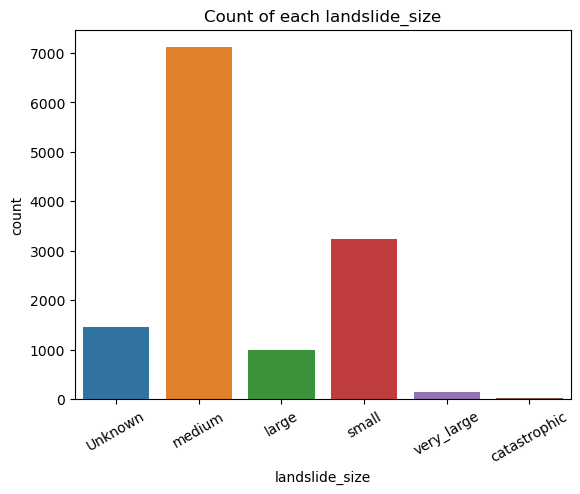

In [28]:
sns.countplot(data=df,x="landslide_size")
plt.title("Count of each landslide_size")
plt.xticks(rotation=30)
plt.show()

Inference:
1. Medium sized landslides have the highest number of occurences
2. Very large sized landslides are very few in number and catastrophic landslides are near to zero.

In [29]:
count=df["landslide_trigger"].value_counts()
print(count)

landslide_trigger
downpour                   4927
rain                       3065
Unknown                    2478
continuous_rain             896
tropical_cyclone            612
snowfall_snowmelt           167
monsoon                     157
mining                      119
construction                113
earthquake                  112
flooding                    102
no_apparent_trigger          80
other                        55
freeze_thaw                  50
dam_embankment_collapse      22
leaking_pipe                 22
volcano                       4
vibration                     3
Name: count, dtype: int64


In [30]:
width = 900
height = 700
labels = count.index
values = count.values
fig = px.pie(values=values, names=labels, title="Interactive Pie Chart of Landslide Triggers",)  
fig.update_layout(
    title_x=0.5, 
    hoverlabel=dict(font_size=16,font_color='black')  
)

fig.update_layout(width=width, height=height)
fig.show()

Inference:
1. Downpour has caused the highest number of landslides, followed by rain.
2. Triggers are unknown for nearly 20 percent of the landslides 

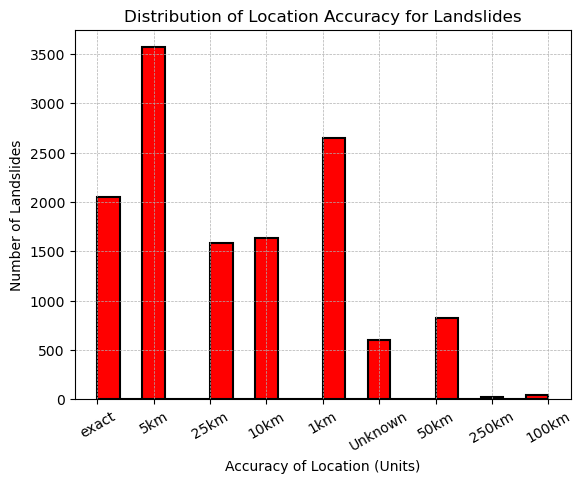

In [31]:
data = df['location_accuracy']
bins = 20  # Number of bins

plt.hist(data, edgecolor="black", bins=bins, color='red', linewidth=1.5, linestyle="-")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

plt.xlabel("Accuracy of Location (Units)")
plt.ylabel("Number of Landslides")

plt.title("Distribution of Location Accuracy for Landslides")
plt.xticks(rotation=30)
plt.show()

Inference:
1. Most number of landslides have occured in 5km accuracy followed by 1km and exact accuracies.
2. The least number of landslides are under 250km accuracy followed by 100km accuracy.
3. The inferences give a positive outcome as we have a significant amount of location accuracies for the landslides.

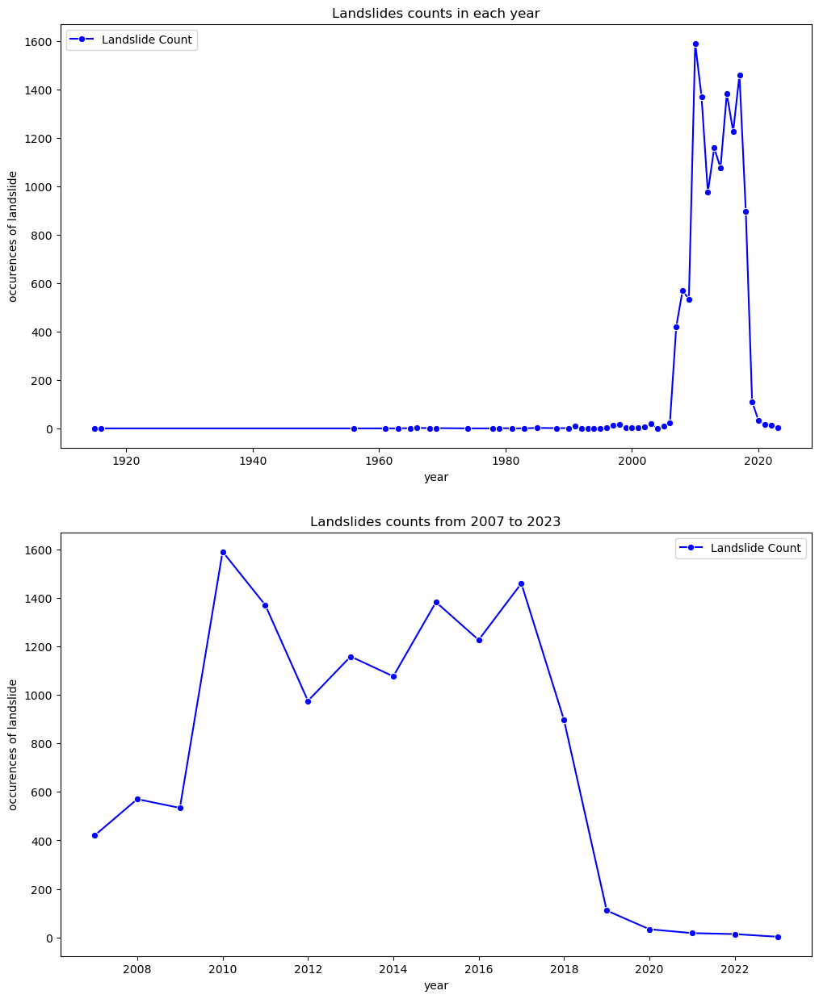

In [32]:
filtered_df = df[(df['year'] >= 2007)]
yearly_data = filtered_df.groupby('year').agg({'event_title': 'count', 'fatality_count': 'sum', 'injury_count': 'sum'}).reset_index()
total_yearly_data = df.groupby('year').agg({'event_title': 'count', 'fatality_count': 'sum', 'injury_count': 'sum'}).reset_index()


plt.figure(figsize=(12,15))
plt.subplot(2,1,1)
sns.lineplot(data=total_yearly_data, x='year', y='event_title', color='blue', marker='o',label='Landslide Count')
plt.ylabel('occurences of landslide')
plt.title('Landslides counts in each year')

plt.subplot(2,1,2)
sns.lineplot(data=yearly_data, x='year', y='event_title', color='blue', marker='o',label='Landslide Count')
plt.ylabel('occurences of landslide')
plt.title('Landslides counts from 2007 to 2023')
plt.show()

Inference:
1. 2010 had the highest number of landslide occurences.
2. There are very few landslides from 1916-2007 and 2018-2023.
3. More number of landslides have occured in between 2009 and 2018.

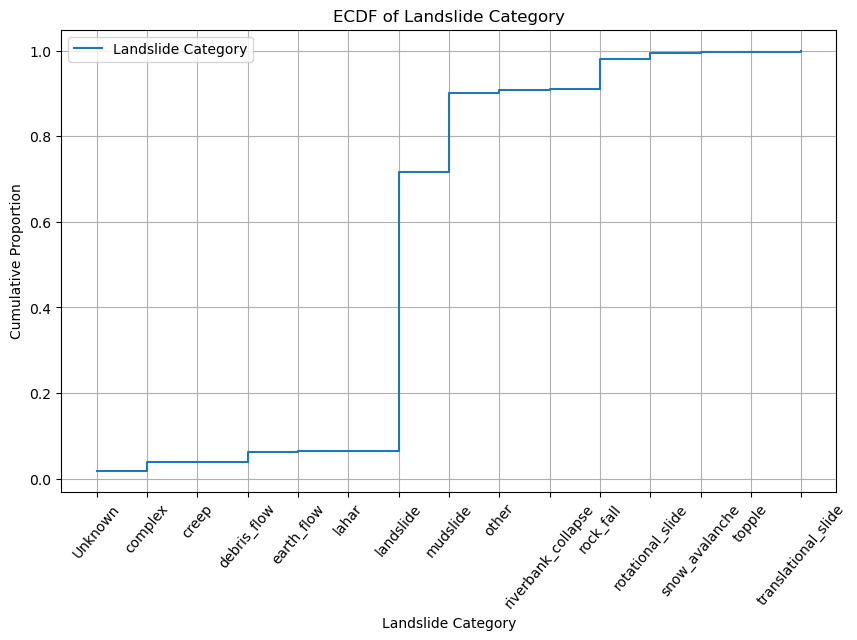

In [33]:
category_counts = df['landslide_category'].value_counts(normalize=True).sort_index()
category_cumulative = category_counts.cumsum()

plt.figure(figsize=(10, 6))
plt.step(category_cumulative.index, category_cumulative, where='post', label='Landslide Category')
plt.title('ECDF of Landslide Category')
plt.xlabel('Landslide Category')
plt.ylabel('Cumulative Proportion')
plt.legend()
plt.xticks(rotation=50)
plt.grid(True)
plt.show()

Inference:
1. The height of landslide is the highest, implying landslide category is the most in number.
2. Riverbank collapse has the lowest height implying to be in lowest numbers followed by other category.

## Bivariate Analysis

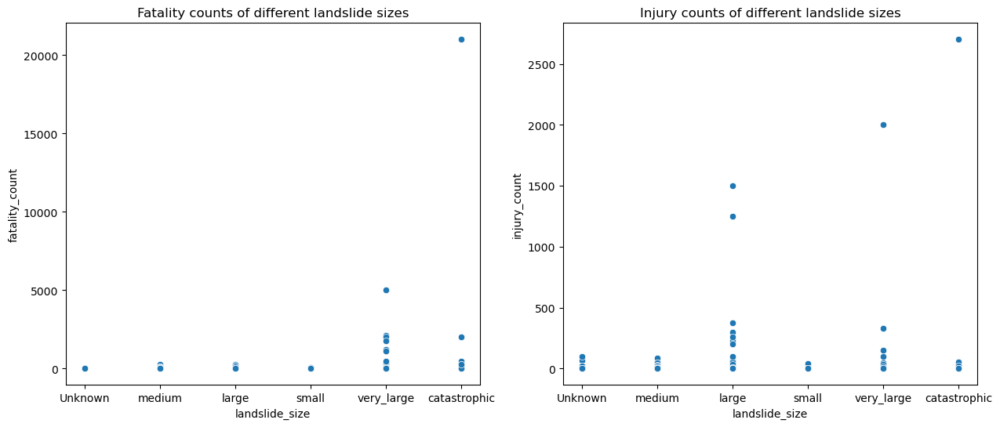

In [34]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
sns.scatterplot(x='landslide_size',y='fatality_count',data=df)
plt.title('Fatality counts of different landslide sizes')
plt.subplot(1,2,2)
sns.scatterplot(x='landslide_size',y='injury_count',data=df)
plt.title('Injury counts of different landslide sizes')
plt.show()

Inference:

->Fatalities:
1. Catastrophic landslides have an outlier implying that one of the catastrophic landslides has taken the lives of a huge number of people due to its catastrophic impact.
2. There are more number of fatality counts in very_large sized landslides as well and in fact they are more in number than the fatalities due to catastrophic ones except for the outlier. This implies that very_large sized landslides have caused a lot of fatalities than the other ones (except catastrophic due to its outlier).
3. Unknown, small size have no fatalities and medium, large size have very few fatalities.

->Injuries:
1. Large size has a higher distribution of injury counts followed by very_large and catastrophic.
2. There are outliers in large, very large, catastrophic implying that there are a few landslides under these categories which have caused a lot injuries out of which the one caused by outlier of catastrophic is the highest.
3. Small has the lowest distribution of injuries followed by medium, unknown and catastrophic(except for the outlier).

In [35]:
print(df['landslide_trigger'].mode())
downpour_data = df[df['landslide_trigger'] == 'downpour']
total_fatality_count = df.groupby('year')['fatality_count'].sum().reset_index()
downpour_fatality_count = downpour_data.groupby('year')['fatality_count'].sum().reset_index()
merged_data = pd.merge(total_fatality_count, downpour_fatality_count, on='year', suffixes=('_total', '_downpour'))

0    downpour
Name: landslide_trigger, dtype: object


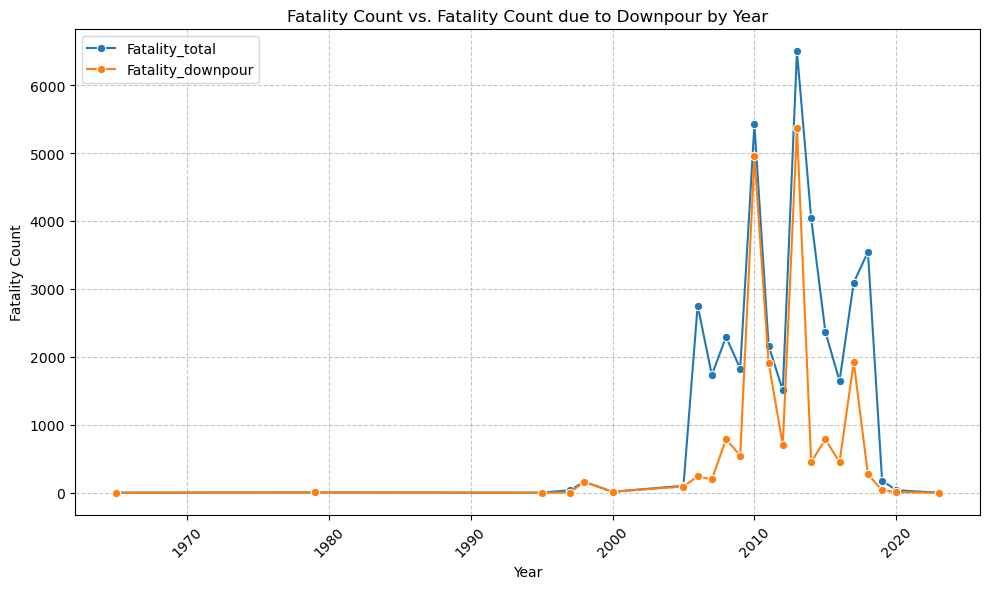

In [36]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=merged_data, x='year', y='fatality_count_total',marker='o',label='Fatality_total')
sns.lineplot(data=merged_data, x='year', y='fatality_count_downpour',marker='o',label='Fatality_downpour')
plt.title('Fatality Count vs. Fatality Count due to Downpour by Year')
plt.xlabel('Year')
plt.ylabel('Fatality Count')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Inference:
1. The counts of downpour are close to the total in most number of years.
2. Though downpour seems to be the mode, the difference between downpour and total count seems to huge in the years under which they differ implying that other triggers have also caused significant number of landslides in the years that had higher landslides.

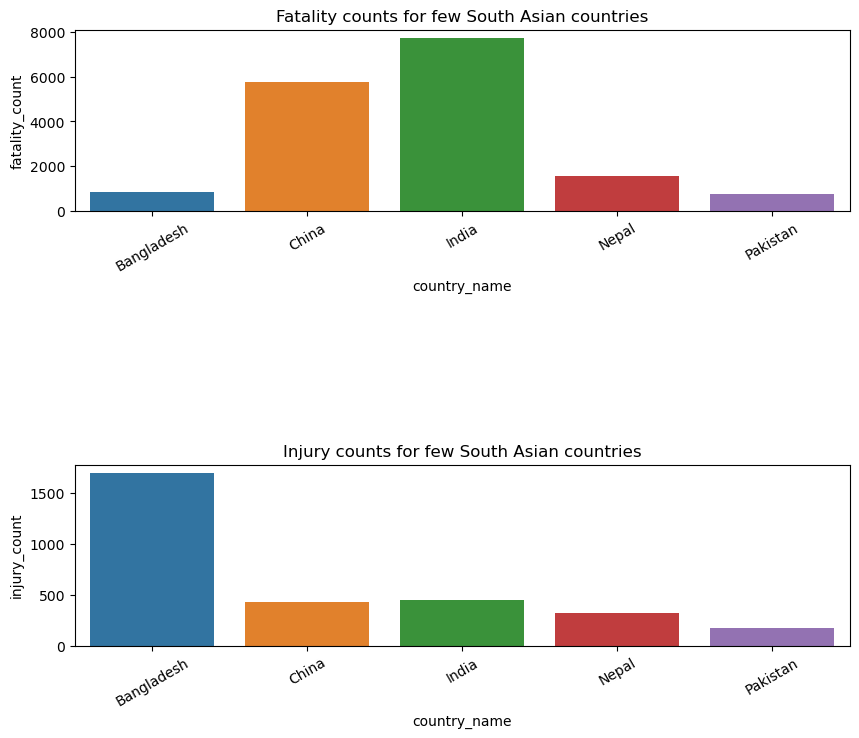

In [37]:
country_records= df.loc[df['country_name'].isin(['India','Pakistan','Nepal','Bangladesh','China'])].groupby('country_name').agg({'fatality_count': 'sum', 'injury_count': 'sum'}).reset_index()

plt.figure(figsize=(10,8))
plt.subplot(3,1,1)
sns.barplot(data=country_records,x='country_name',y='fatality_count')
plt.xticks(rotation=30)
plt.title('Fatality counts for few South Asian countries')
plt.subplot(3,1,3)
sns.barplot(data=country_records,x='country_name',y='injury_count')
plt.title('Injury counts for few South Asian countries')
plt.xticks(rotation=30)
plt.show()

Inference:
1. India has the highest fatality counts and Bangladesh has the highest injury counts among the countries.
2. Pakistan has the lowest in both the counts followed by Nepal.

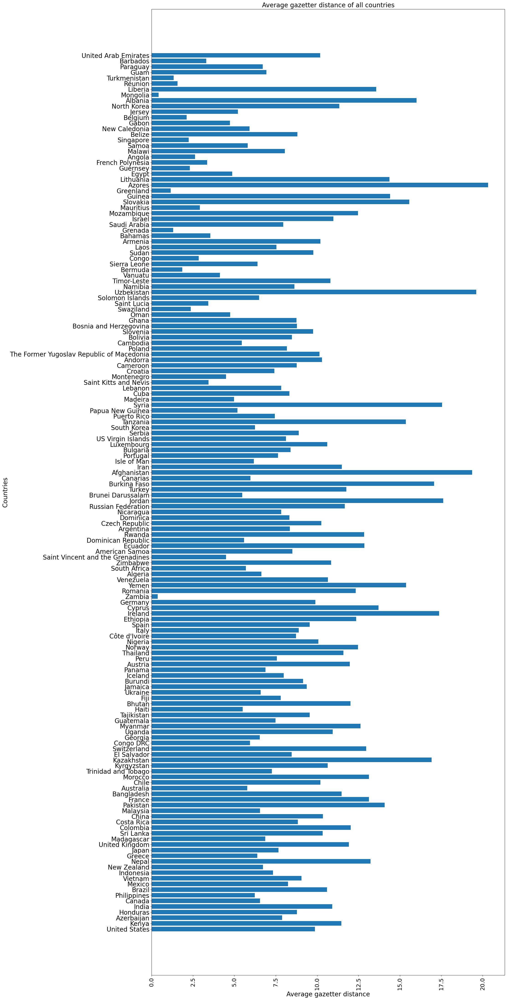

In [38]:
country = []
dist_avg = []
for i in df['country_name'].unique():
    country.append(i)
    df1 = df.loc[df['country_name']==i]
    dist_avg.append(df1['gazetteer_distance'].mean())
plt.figure(figsize=(20,55))
plt.barh(country,dist_avg)
plt.xticks(rotation=90,size=18)
plt.yticks(size=20)
plt.xlabel('Average gazetter distance',size=20)
plt.ylabel('Countries',size=20)
plt.title('Average gazetter distance of all countries',size=20)
plt.show()

Inference:
1. Azores has the highest average gazetter distance.
2. Zambia has the lowest average gazetter distance.
3. Values of the average gazetter distance range from 2 to 20.

In [39]:
plt.figure(figsize=(10,6))
fig = px.histogram(x=df['landslide_setting'],color=df['landslide_size'],hover_name=df['landslide_size'])
fig.update_layout(xaxis_title='Landslide setting',title='Counts of landslide setting',title_x=0.5)

<Figure size 1000x600 with 0 Axes>

Inference:
1. Most of the landslide setting is unknown.
2. Medium sized landslides are the most in each setting.
3. Below road has the lowest counts followed by above coast. 

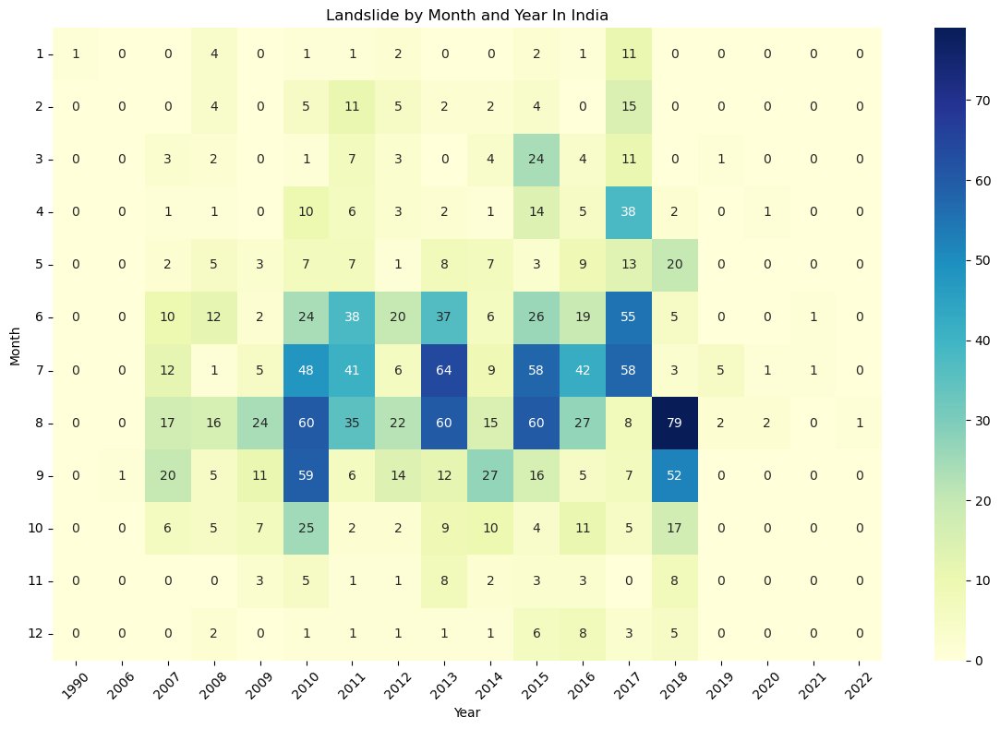

In [40]:
data_records = df[(df['country_name'] =='India')]
pivot_table = data_records.pivot_table(index='month', columns='year', aggfunc='size', fill_value=0)
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='YlGnBu', annot=True)
plt.title('Landslide by Month and Year In India')
plt.xlabel('Year')
plt.ylabel('Month')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Inference:
1. August has had the highest number of landslides in India followed by July, June and September.
2. Most number of Landslides have occured during the months of june to september across all the years which implies that landslides have occured majorly in the monsoon seasons in India.
3. Most number of landslides have occured in between 2010 to 2018.

In [41]:
x = pd.DataFrame(df['country_name'].value_counts().sort_values(ascending=False))
x.head()

,count
country_name,
United States,3950
India,1738
Philippines,777
Nepal,587
China,575


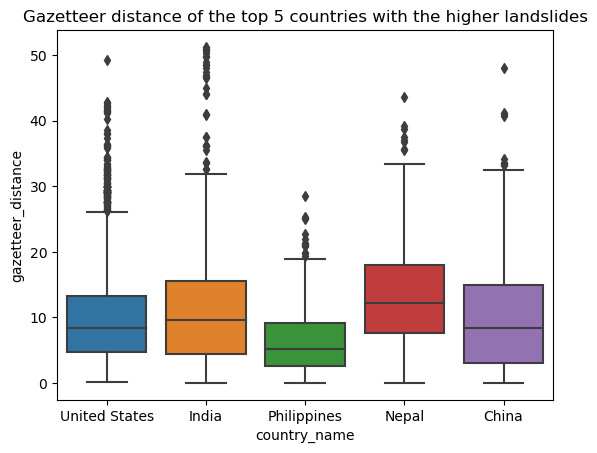

In [42]:
sns.boxplot(data=df.loc[df['country_name'].isin(['United States','India','Philippines','Nepal','China'])],x='country_name',y='gazetteer_distance')
plt.title('Gazetteer distance of the top 5 countries with the higher landslides')
plt.show()

Inference:
1. China has the lowest number of outliers with skewness close to zero, followed by Nepal which is skewed to the left slightly.
2. United States and India have huge number of outliers.
3. India has zero skewness whereas United States is slightly left skewed.
4. Philippines has the lowest range of values followed by US.

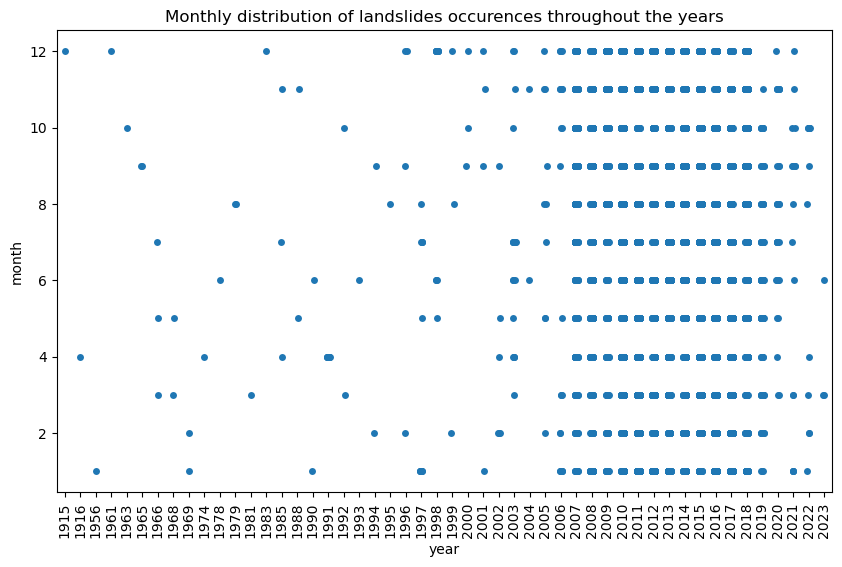

In [43]:
plt.figure(figsize=(10,6))
sns.stripplot(x=df['year'],y=df['month'])
plt.xticks(rotation=90)
plt.title('Monthly distribution of landslides occurences throughout the years')
plt.show()

Inferences:
1. Landslides have occured in all the months in the years of 2007-2018.
2. The landslides have occured only in a few months in the years 1915-2005 and 2020-2023.

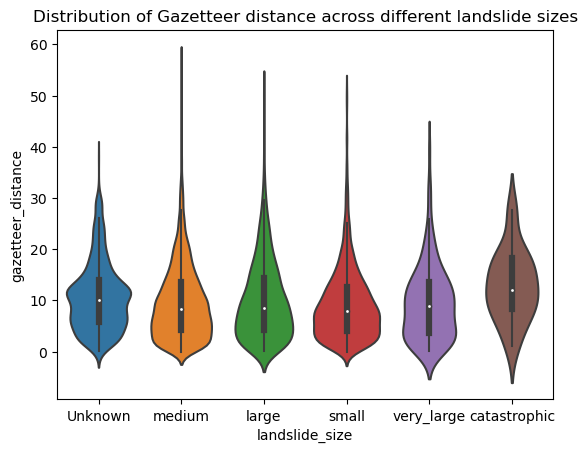

In [44]:
sns.violinplot(x='landslide_size',y='gazetteer_distance',data=df)
plt.title('Distribution of Gazetteer distance across different landslide sizes')
plt.show()

Inference:
1. Catastrophic has no outliers, left skewed and Unknown has very few outliers with slight right skewed data.
2. All other landslide sizes have a lot of outliers with a very few skewness or no skewness.
3. Medium size landslides have the highest of outliers.

In [45]:
average_injury_counts = df.groupby('landslide_size')['injury_count'].mean().reset_index()

fig = px.pie(average_injury_counts, values='injury_count', names='landslide_size',
             title='Average Number of Injury Count by Landslide Size',
             labels={'landslide_size': 'Landslide Size', 'injury_count': 'Average Injury Count'},
             hole=0.3)

fig.update_layout(title_x=0.5)
fig.show()

Inference:
1. Catastrophic landslides have the most highest average injury count followed by very large and large sized.
2. Medium, small and Unknown have very low average injury counts.

## Multivariate Analysis

In [46]:
filtered_df = df[(df['year'] >= 2007) & (df['year'] <= 2023)]
yearly_data = filtered_df.groupby('year').agg({'event_title': 'count', 'fatality_count': 'sum', 'injury_count': 'sum'}).reset_index()

fig = px.line(yearly_data,x='year',y=['fatality_count','injury_count'])
fig.update_layout(title='Year wise fatality and injury count from 2007 to 2023', title_x = 0.5)

Inference:
1. 2010 had the highest fatality count and 2017 had the highest injury count.
2. There isn't a steady correlation between injury and fatality counts.
3. The fatality counts seem to be higher than injury counts during the landslides.

In [49]:
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_name="event_title",
                        hover_data=["country_name", "landslide_trigger","landslide_size","landslide_setting"],
                        color=df['landslide_size'])


fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Landslide Locations',title_x=0.5)
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})


fig.show()

Innference:
1. Landslide events are densely populated in certain areas around Southeast Asia, South America, and Central America.
2. The sizes of the landslides vary, with some regions experiencing larger landslides than others.

In [48]:
fig = px.scatter_3d(df, x='year',y='injury_count', z='fatality_count', color='year', size_max=10, opacity=0.7)

fig.update_layout(scene=dict(
                    xaxis_title='year',
                    yaxis_title='injury_count',
                    zaxis_title='fatality_count'),
                    title='3D Visualization of injury and fatality counts',title_x = 0.5)

fig.show()

Inference:
1. 2014 had the landslide with the highest fatality count of 2100 but the injury counts were nill.
2. 1999 had the landslide with highest injury count of 2700 whose fatality counts were 248.
3. Most number of injury counts and fatality counts are in the range of 0-500 except some 7-8 points.